In [2]:
import pandas as pd
import os
import numpy as np
import zipfile
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd
import warnings

import matplotlib.pyplot as plt

from scipy.spatial.distance import cdist

from sklearn.preprocessing import StandardScaler #for standardization

from sklearn.cluster import KMeans

from sklearn.decomposition import PCA #for cluster visualization (and dimensionality reduction)

from sklearn.ensemble import RandomForestClassifier #for feature importance

from statsmodels.tsa.statespace.sarimax import SARIMAX

import seaborn as sns

from plotly.offline import iplot

from statsmodels.tsa.arima.model import ARIMA

from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error

from math import sqrt


plt.rcParams['figure.figsize'] = [8,8]


sns.set(style='darkgrid')

%matplotlib inline

In [3]:
df = pd.read_csv("MASTER_DATASET.csv")

**Data Analysis: Make a Heat Map**

In [4]:
df1 = df.drop(columns = ['oblast_or_country','pcode','period'])

(32.0, -1.0)

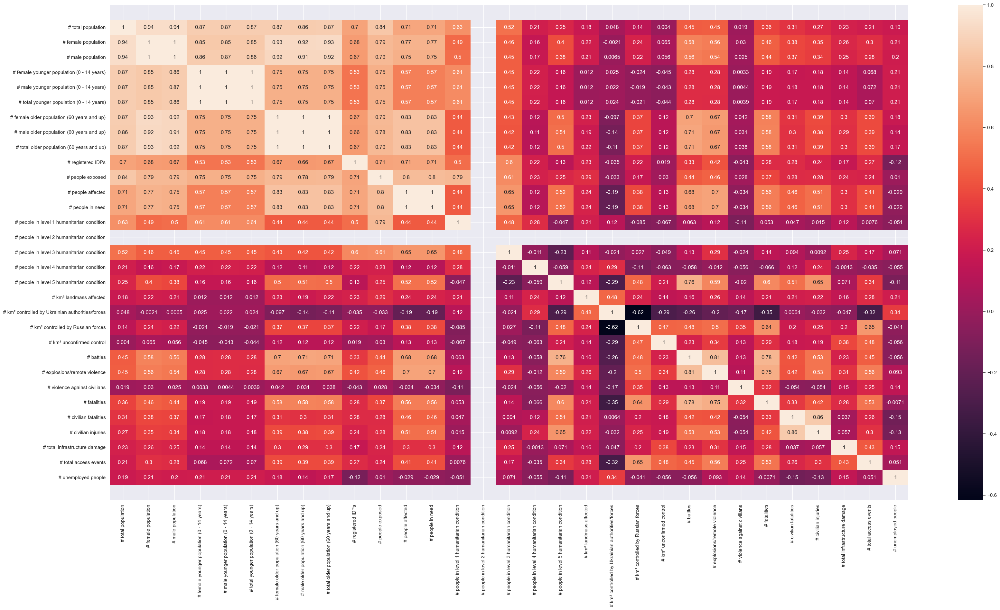

In [5]:
plt.figure(figsize = (40,20))        
ax = sns.heatmap(df1.corr(),annot = True,xticklabels=True, yticklabels=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 1, top - 1)


In [6]:
df.drop(columns=['pcode'], inplace=True) # dropping the unneeded postal code column
df.head()

,oblast_or_country,# total population,# female population,# male population,# female younger population (0 - 14 years),# male younger population (0 - 14 years),# total younger population (0 - 14 years),# female older population (60 years and up),# male older population (60 years and up),# total older population (60 years and up),...,# battles,# explosions/remote violence,# violence against civilians,# fatalities,# civilian fatalities,# civilian injuries,# total infrastructure damage,# total access events,# unemployed people,period
0,Cherkaska,1157115,624475,532640,75552,81536,157088,196700,110769,307469,...,0,0,0,0,0,0,0,0,16808,Jan2022
1,Chernihivska,950773,518447,432326,61356,64084,125440,174896,90800,265696,...,0,0,0,0,0,0,0,0,10534,Jan2022
2,Chernivetska,887392,468777,418615,73482,78391,151873,116988,69688,186676,...,0,0,0,0,0,0,0,0,5969,Jan2022
3,Dnipropetrovska,3093176,1680750,1412426,226943,240091,467034,503014,265558,768572,...,0,0,0,0,0,0,0,0,23984,Jan2022
4,Donetska,4046487,2207252,1839235,204708,218811,423519,810872,465603,1276475,...,101,180,0,4,0,0,0,0,10008,Jan2022


**Standardizing the Data**

In [7]:
warnings.filterwarnings('ignore')

In [8]:
# Scaling the time column

reference_date = pd.to_datetime(df['period']).min()
df['scaled_time'] = (pd.to_datetime(df['period']) - reference_date).dt.days
df.drop(columns=['period'], inplace=True)
print(df['scaled_time'])

0        0
1        0
2        0
3        0
4        0
      ... 
520    608
521    608
522    608
523    608
524    608
Name: scaled_time, Length: 525, dtype: int64


In [9]:
# Standard Scaler for standardization

numerical_features = df.columns.difference(['oblast_or_country']) #all except oblast (non-numerical)

scaler = StandardScaler() #initialize

# Standardize the numerical features
df[numerical_features] = scaler.fit_transform(df[numerical_features])

In [10]:
df = pd.get_dummies(df, columns=['oblast_or_country'], prefix='oblast')

print(df)

     # total population  # female population  # male population  \
0             -0.591140            -0.577772          -0.614932   
1             -0.834609            -0.817863          -0.885915   
2             -0.909394            -0.930336          -0.922953   
3              1.693271             1.814066           1.761675   
4              2.818108             3.006281           2.914634   
..                  ...                  ...                ...   
520            0.160338            -0.774210          -0.754692   
521           -0.647912            -0.532294          -0.440847   
522           -0.894517            -0.167774          -0.171228   
523           -0.468563             0.023392          -0.033943   
524           -0.364730            -0.566468          -0.567135   

     # female younger population (0 - 14 years)  \
0                                     -0.823883   
1                                     -1.095502   
2                                     -0.8

In [11]:
df.head()

,# total population,# female population,# male population,# female younger population (0 - 14 years),# male younger population (0 - 14 years),# total younger population (0 - 14 years),# female older population (60 years and up),# male older population (60 years and up),# total older population (60 years and up),# registered IDPs,...,oblast_Odeska,oblast_Poltavska,oblast_Rivnenska,oblast_Sumska,oblast_Ternopilska,oblast_Vinnytska,oblast_Volynska,oblast_Zakarpatska,oblast_Zaporizka,oblast_Zhytomyrska
0,-0.591140,-0.577772,-0.614932,-0.823883,-0.801209,-0.812206,-0.404874,-0.409386,-0.406802,-0.893337,...,False,False,False,False,False,False,False,False,False,False
1,-0.834609,-0.817863,-0.885915,-1.095502,-1.114387,-1.105280,-0.545894,-0.636307,-0.579102,-0.921143,...,False,False,False,False,False,False,False,False,False,False
2,-0.909394,-0.930336,-0.922953,-0.863489,-0.857646,-0.860499,-0.920419,-0.876216,-0.905034,-0.960604,...,False,False,False,False,False,False,False,False,False,False
3,1.693271,1.814066,1.761675,2.072754,2.044082,2.058019,1.576241,1.349583,1.495099,-0.406555,...,False,False,False,False,False,False,False,False,False,False
4,2.818108,3.006281,2.914634,1.647321,1.662210,1.655052,3.567342,3.622826,3.590034,3.126069,...,False,False,False,False,False,False,False,False,False,False


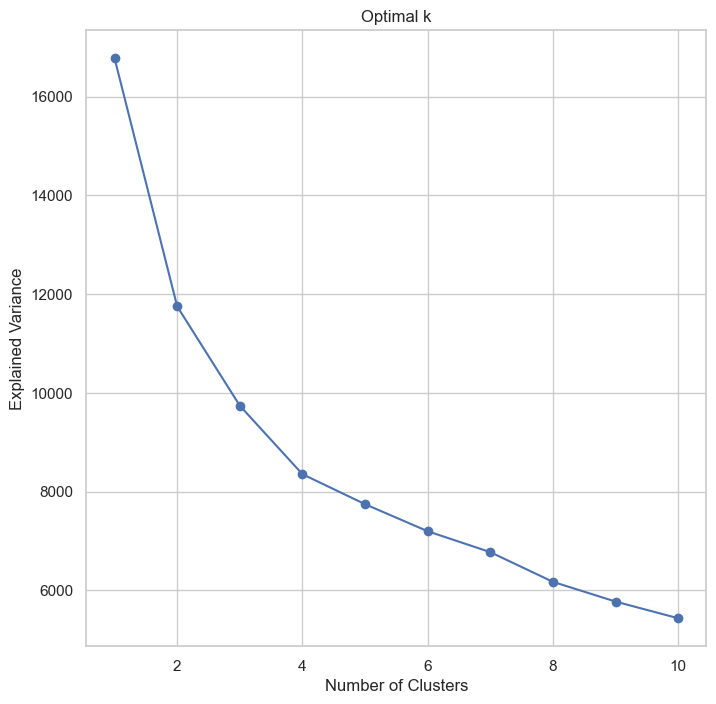

In [12]:
# Elbow method for finding best k value

# Select range of values (let's do 1-10 for now)
k_values = range(1, 11)

explained_variances = [] #initialzing list

# Fit model for diff values of k and calculate variance
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df)
    explained_variances.append(kmeans.inertia_)

# Plot explained variances
sns.set_style("whitegrid", {'axes.grid' : False})
plt.plot(k_values, explained_variances, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Explained Variance')
plt.title('Optimal k')
plt.grid(True)
plt.show()

It looks like the optimal value for k is 4.

**Starting k-Means Clustering**

In [13]:
k = 4

kmeans = KMeans(n_clusters=k, random_state=0)

# fit the model to the data
cluster_labels = kmeans.fit_predict(df)

In [14]:
print(cluster_labels)

[1 1 1 0 0 1 1 1 1 1 0 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 1 0 1
 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 2 1 3 3 1 1 0 3 3 0 1 0 1 1 1 1 1 1 1 3
 1 1 1 1 0 2 1 0 3 1 1 0 1 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0
 1 3 0 3 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 1 3 0 1 0 1 1 1 1 1 1 1
 3 1 1 1 1 0 2 1 0 3 1 1 0 1 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1
 0 1 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1 1 1
 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1
 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1 1
 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3
 1 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1
 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0
 3 1 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1
 1 1 1 1 3 1 1 1 1 0 2 1 0 3 1 1 0 0 3 0 1 0 1 1 1 1 1 1 1 3 1 1 1 1 0 2 1
 0 3 1 1 0 0 3 0 1 0 1 1 

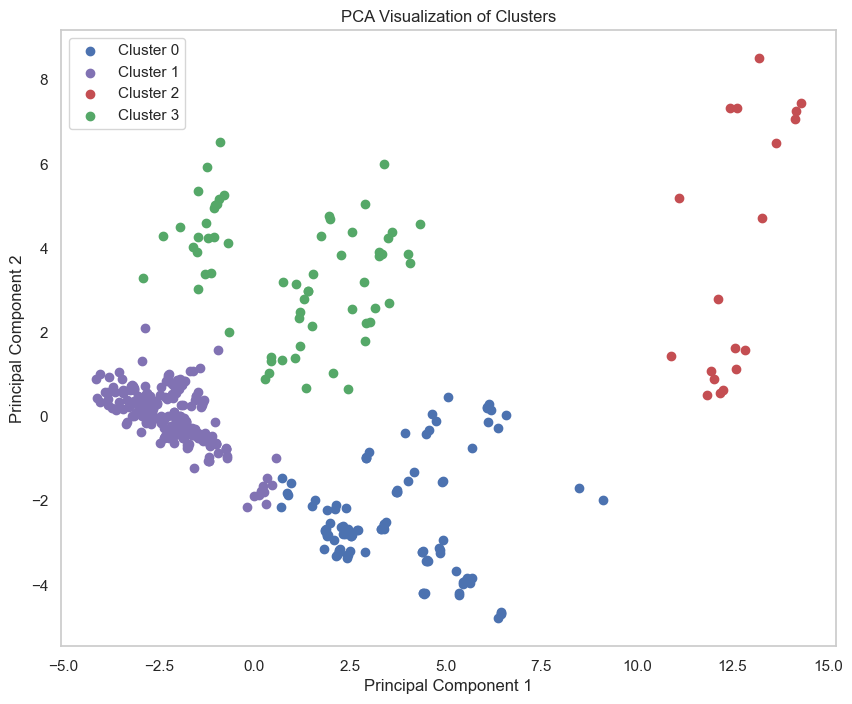

In [15]:
# PCA visualization of clusters

pca = PCA(n_components=2)  # Keep the first two principal components
principal_components = pca.fit_transform(df)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Add the cluster labels to pca_df
pca_df['Cluster'] = cluster_labels

colors = ['b', 'm', 'r', 'g']
plt.figure(figsize=(10, 8))

for cluster in range(4): # k=4 clusters
    cluster_data = pca_df[pca_df['Cluster'] == cluster]
    plt.scatter(cluster_data['PC1'], cluster_data['PC2'], c=colors[cluster], label=f'Cluster {cluster}')
    
sns.set_style("whitegrid", {'axes.grid' : False})
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization of Clusters')
plt.legend(loc='best')
plt.show()

In [16]:
cluster_means = pca_df.groupby('Cluster').mean()
print(cluster_means)

               PC1       PC2
Cluster                     
0         3.652090 -2.500683
1        -2.176859 -0.013125
2        12.632961  3.869702
3         0.949560  3.426535


**Finding Feature Importance**

In [17]:
# Create a Random Forest Classifier
clf = RandomForestClassifier(random_state=48)

# Fit the model on data
clf.fit(df, cluster_labels)

# Get feature importances and their labels
importances = clf.feature_importances_
feature_labels = df.columns
feature_importance_df = pd.DataFrame({'Feature': feature_labels, 'Importance': importances})

# Sort importances
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print(feature_importance_df)

                                             Feature    Importance
1                                # female population  8.070853e-02
2                                  # male population  7.650293e-02
8         # total older population (60 years and up)  6.873765e-02
20                # km² controlled by Russian forces  6.741090e-02
6        # female older population (60 years and up)  6.213507e-02
5          # total younger population (0 - 14 years)  6.122757e-02
7          # male older population (60 years and up)  5.778899e-02
3         # female younger population (0 - 14 years)  4.863106e-02
19  # km² controlled by Ukrainian authorities/forces  4.833269e-02
0                                 # total population  4.804739e-02
10                                  # people exposed  4.676564e-02
4           # male younger population (0 - 14 years)  4.141715e-02
22                                         # battles  3.167689e-02
25                                      # fatalities  3.083945

In [18]:
pca_df.head()

,PC1,PC2,Cluster
0,-3.427481,0.182315,1
1,-4.028508,0.352261,1
2,-4.127497,0.884478,1
3,1.815292,-3.149568,0
4,8.499157,-1.706100,0


**Correlation Matrix for Entire Dataset**

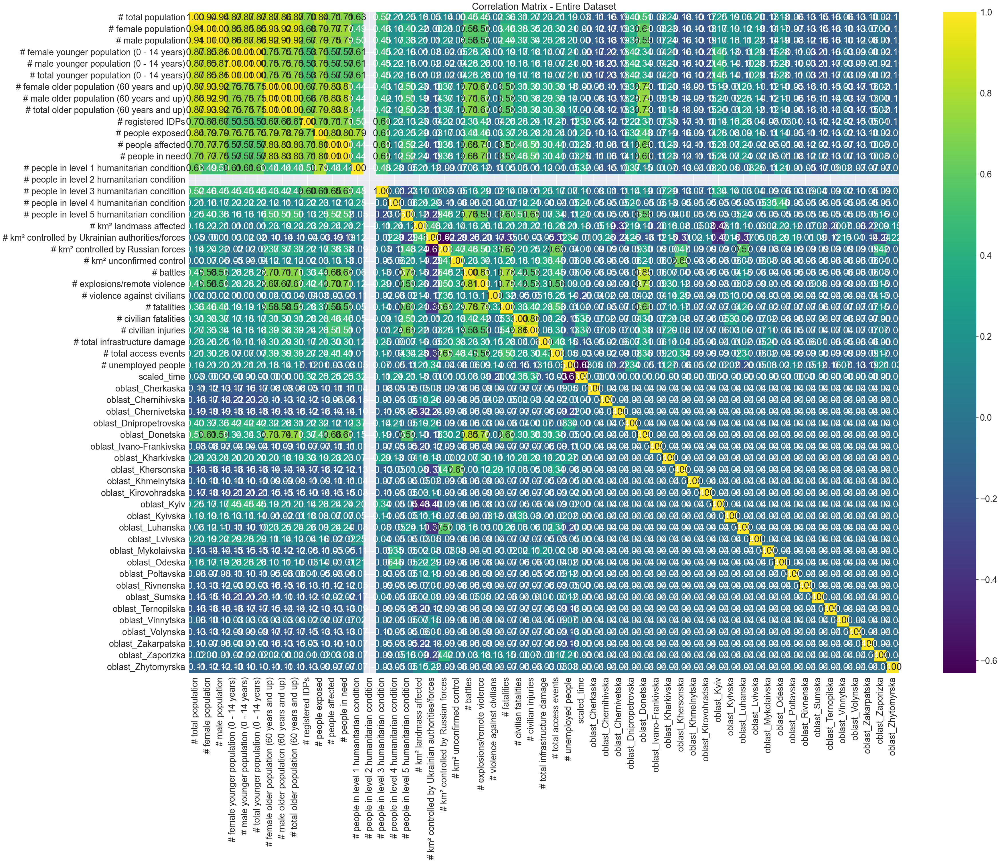

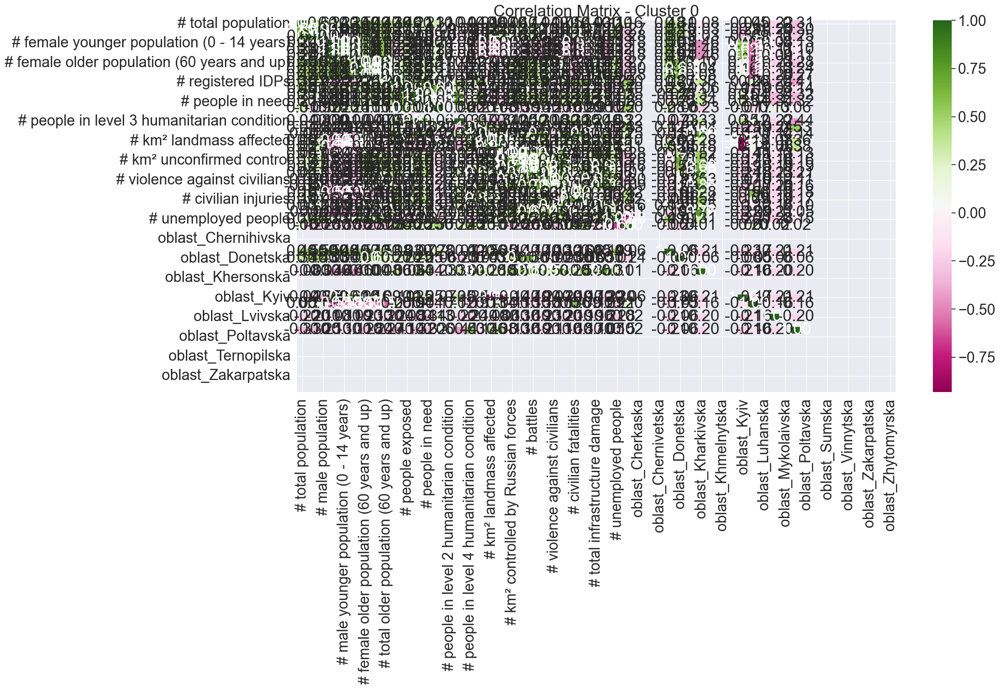

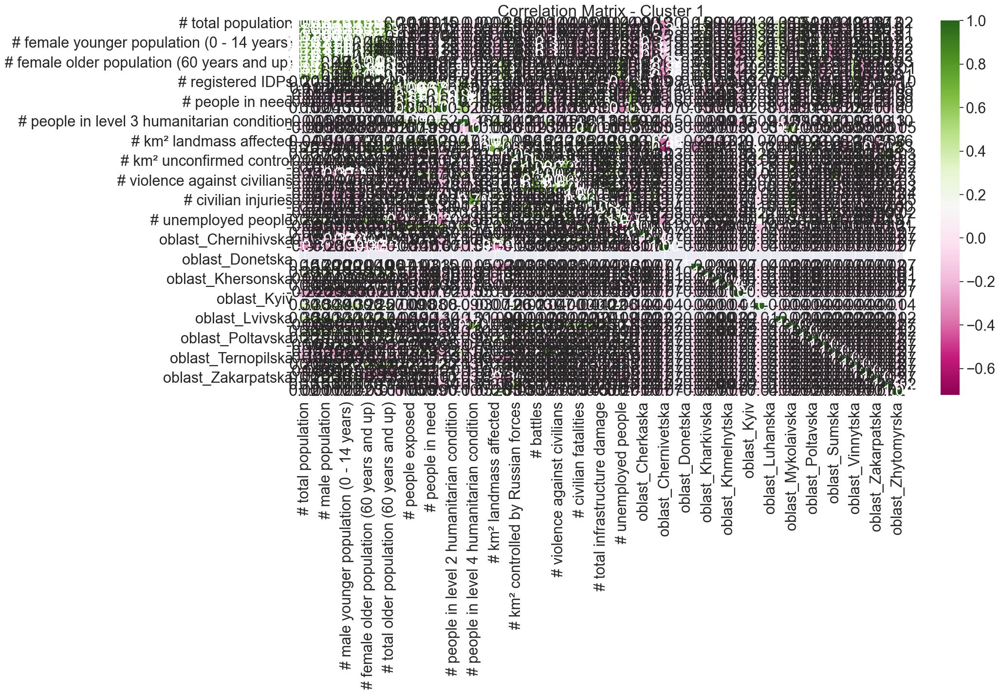

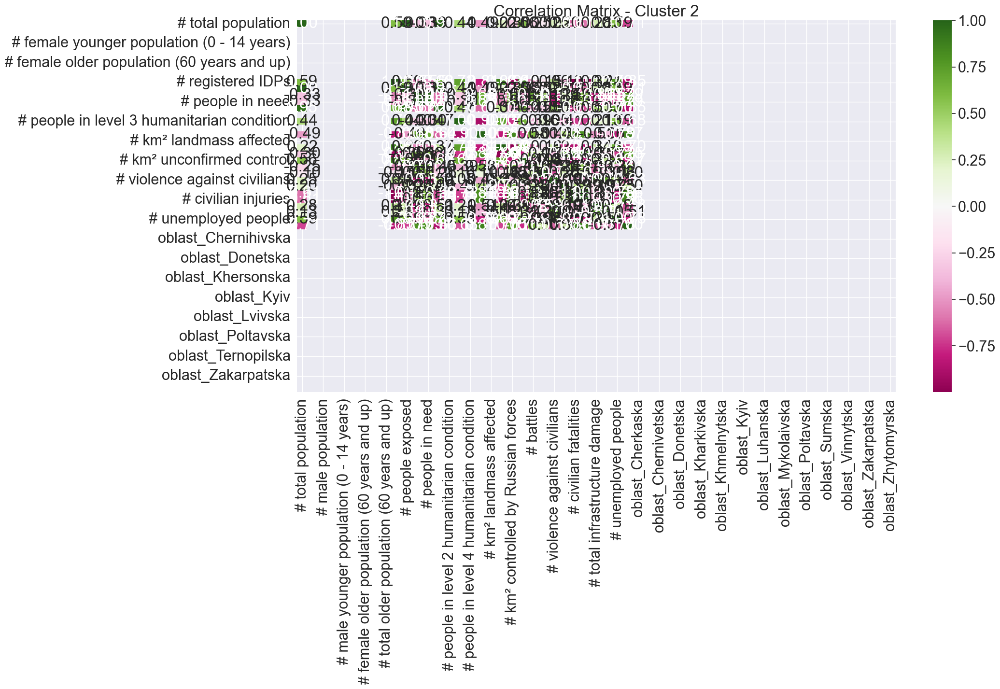

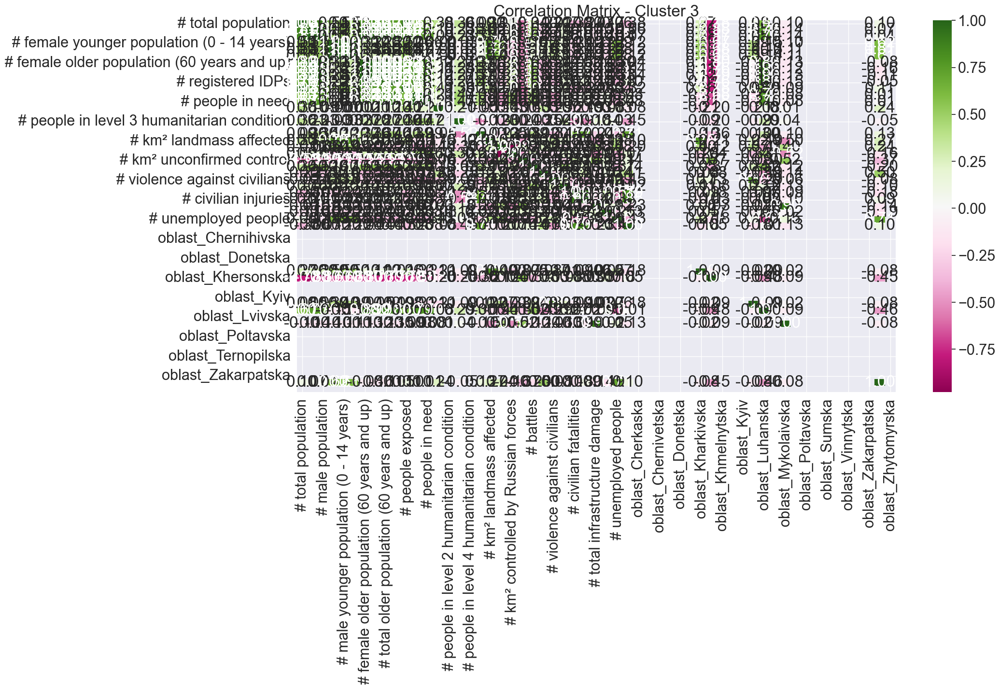

In [19]:
# Correlation matrix for the dataset df
correlation_matrix = df.corr()

# Correlation matrices for each of the clusters
cluster_correlation_matrices = []
for cluster in range(4):  # Assuming you have 4 clusters
    cluster_data = df[cluster_labels == cluster]
    cluster_correlation_matrices.append(cluster_data.corr())

# Heatmap for the entire dataset
sns.set(font_scale=2.0)
plt.figure(figsize=(40, 30))
sns.heatmap(correlation_matrix, cmap='viridis', annot=True, fmt=".2f" ) # 2 decimal places
plt.title('Correlation Matrix - Entire Dataset')
plt.show()

# Heatmaps for each cluster
for cluster, cluster_corr_matrix in enumerate(cluster_correlation_matrices):
    plt.figure(figsize=(20, 10))
    sns.heatmap(cluster_corr_matrix, cmap='PiYG', annot=True, fmt=".2f") # 2 decimal places
    plt.title(f'Correlation Matrix - Cluster {cluster}')
    plt.show()

*The correlation matrices for each cluster seems to be jumbled together and overall messy for interpretability, so based on the feature importance, let's inspect the 7 most importance features for each cluster to investigate any correlation*

In [20]:
df1 = df.filter(['# female older population (60 years and up)','# registered IDPs','# people affected','# km² unconfirmed control','# km² controlled by Ukrainian authorities/forces','# km² controlled by Russian forces', '# male population','# total older population (60 years and up)'],axis=1)

**Correlation Matrix for each Cluster**

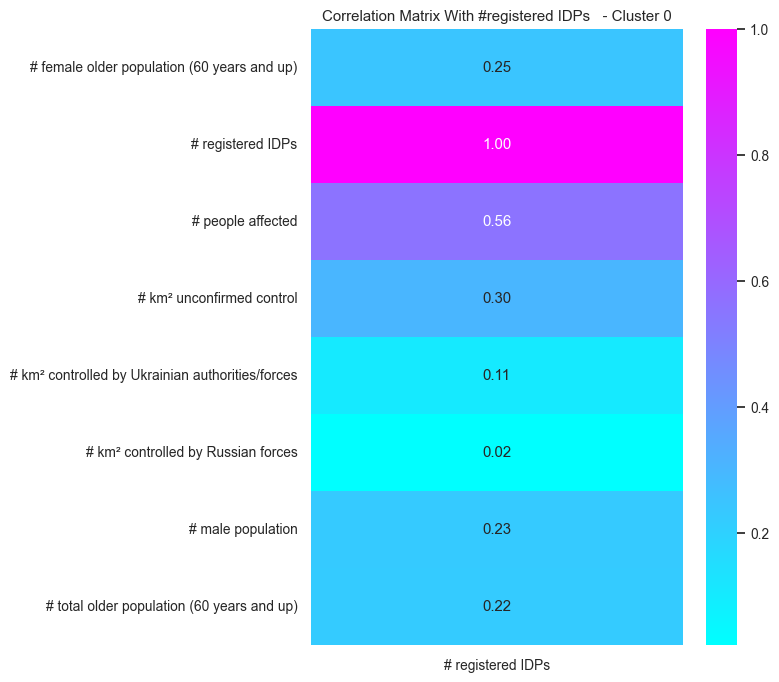

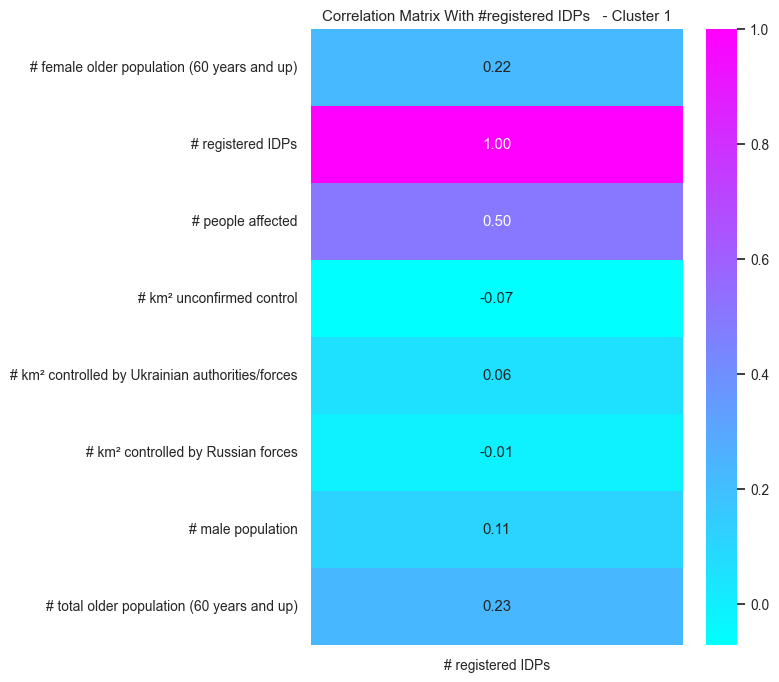

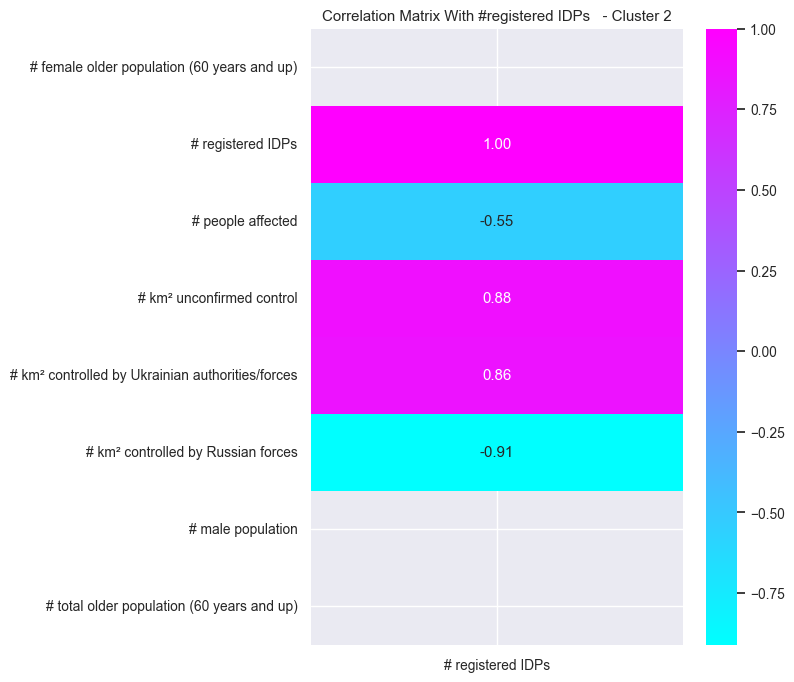

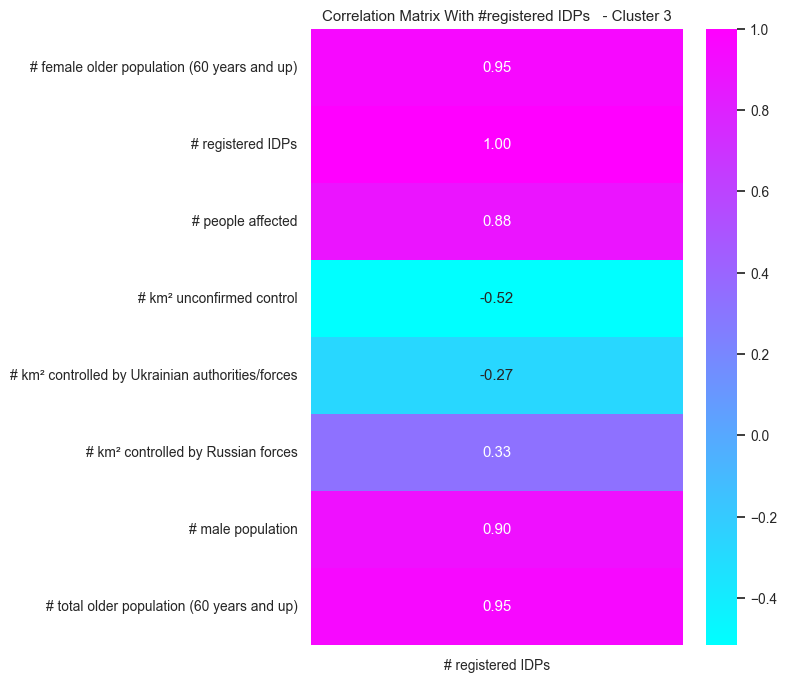

In [21]:
# Correlation matrix for the dataset df
correlation_matrix = df1.corr()

#change font back to a smaller font for interpretability purposes
sns.set(font_scale=.9)
# Correlation matrices for each of the clusters
cluster_correlation_matrices = []
for cluster in range(4):  # Assuming you have 4 clusters
    cluster_data = df1[cluster_labels == cluster]
    cluster_correlation_matrices.append(cluster_data.corr())

for cluster, cluster_corr_matrix in enumerate(cluster_correlation_matrices):
    plt.figure(figsize=(6, 8))
    sns.heatmap(cluster_corr_matrix[['# registered IDPs']], cmap='cool', annot=True, fmt=".2f") # 2 decimal places
    plt.title(f'Correlation Matrix With #registered IDPs   - Cluster {cluster}')
    plt.show()

**Creating a Time Series Model**

*Stanadardizing the Data*

In [22]:
df2 = pd.read_csv("MASTER_DATASET.csv")
df2.drop(columns=['pcode'], inplace=True)

In [23]:
reference_date = pd.to_datetime(df2['period']).min()
df2['scaled_time'] = (pd.to_datetime(df2['period']) - reference_date).dt.days
df2.drop(columns=['period'], inplace=True)
print(df2['scaled_time'])

0        0
1        0
2        0
3        0
4        0
      ... 
520    608
521    608
522    608
523    608
524    608
Name: scaled_time, Length: 525, dtype: int64


In [24]:
# Encoding oblast column

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df2['oblast_or_country'] = le.fit_transform(df2['oblast_or_country'])

In [25]:
df2['scaled_time'] = pd.to_datetime(df2['scaled_time'], unit='D', origin=0)
df2.sort_values(by='scaled_time', inplace=True)
df2.set_index('scaled_time', inplace=True)  # Setting scaled_time as the index

In [26]:
# Standard Scaler for standardization

numerical_features = df2.columns.difference(['oblast_or_country']) #all except oblast (not standardizing)

scaler = StandardScaler()

# Standardizing the numerical features
df2[numerical_features] = scaler.fit_transform(df2[numerical_features])

In [27]:
scaled_idps_column = df2['# registered IDPs']

min_scaled_idps = scaled_idps_column.min()
max_scaled_idps = scaled_idps_column.max()

print(f"Range of Scaled IDPs: {min_scaled_idps} to {max_scaled_idps}")

Range of Scaled IDPs: -0.9715046208234186 to 3.126069058173752


In [28]:
time_series_data = df2[['oblast_or_country', '# registered IDPs']]

# TSplitting dataset
train_size = int(len(time_series_data) * 0.8)
train, test = time_series_data.iloc[:train_size, :], time_series_data.iloc[train_size:, :]

# ARIMA model training
model = ARIMA(train, order=(1,1,0))
model_fit = model.fit()

# Making predictions
predictions = model_fit.forecast(steps=len(test.columns), index=test.index)

# Evaluating the model using RMSE
rmse = sqrt(mean_squared_error(test, predictions))
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Plotting predictions
plt.figure(figsize=(12, 6))
plt.plot(train.index, train.values, label='Train')
plt.plot(test.index, test.values, label='Test')
plt.plot(predictions.index, predictions.values, label='Predictions')
plt.legend()
plt.title('ARIMA Model Predictions')
plt.xlabel('Time')
plt.ylabel('# registered IDPs')
plt.show()

ValueError: SARIMAX models require univariate `endog`. Got shape (420, 2).

In [ ]:
# Predicting '# registered IDPs'
selected_oblast = 20

# Extracting relevant columns (scaled_time is already set as the index!)
time_series_data = df2[df2['oblast_or_country'] == selected_oblast][['# registered IDPs']]

# Splitting dataset
train_size = int(len(time_series_data) * 0.8) #0.8 train, 0.2 test
train, test = time_series_data.iloc[:train_size, :], time_series_data.iloc[train_size:, :]

# SARIMAX model training
model = SARIMAX(train, order=(0, 1, 1), seasonal_order=(0, 0, 1, 12))  # Optimal from grid search
model_fit = model.fit()

# Making predictions
predictions = model_fit.get_forecast(steps=len(test))
predicted_values = predictions.predicted_mean

# Evaluating the model using RMSE
rmse = sqrt(mean_squared_error(test, predicted_values))
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['# registered IDPs'], label='Train')
plt.plot(test.index, test['# registered IDPs'], label='Test')
plt.plot(test.index, predicted_values, label='Predictions')
plt.legend()
plt.title(f'SARIMAX Model Predictions for {selected_oblast}', fontname='Franklin Gothic Medium')
plt.xlabel('Time', fontname='Franklin Gothic Medium')
plt.ylabel('# registered IDPs',fontname='Franklin Gothic Medium')
plt.show()

*The Root Mean Squared Error is low, indicating a good fit for our model to forecast registered internally displaced people numbers
Note : The time scale listed on the x-axis is the default set year value from the 1970s and is representative of the range of 2022-2023*

Machine precision = 2.220D-16
 N =            3     M =           10
 This problem is unconstrained.

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.52427D-01    |proj g|=  6.20870D-01

At iterate    5    f=  3.32046D-01    |proj g|=  1.07073D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     13      1     0     0   1.004D-05   3.320D-01
  F =  0.33204586791932966

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH

In [ ]:
#Use a grid search to find the optimal values for seasonal order + order
import itertools

p = d = q = range(5, 7)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in pdq]

best_rmse = float('inf')
best_order = None
best_seasonal_order = None
print('Printing best RMSE + order')
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(train, order=param, seasonal_order=param_seasonal)
            model_fit = model.fit()
            predictions = model_fit.get_forecast(steps=len(test)).predicted_mean
            rmse = sqrt(mean_squared_error(test, predictions))

            if rmse < best_rmse:
                best_rmse = rmse
                best_order = param
                best_seasonal_order = param_seasonal

        except:
            continue
print(f'Best RMSE score: {best_rmse}')
print(f'Best order: {best_order}')
print(f'Best seasonal order: {best_seasonal_order}')

In [ ]:
df3 = pd.read_csv("MASTER_DATASET.csv")
df3.drop(columns=['pcode'], inplace=True)

In [ ]:
# Create new DataFrame to store clusters
oblast_clusters = pd.DataFrame({'Oblast': df3['oblast_or_country'], 'Cluster': cluster_labels})

# Initialize a dictionary to store oblasts belonging to each cluster
clusters = {i: [] for i in range(k)}

# Iterate through each oblast and its corresponding cluster label
for index, row in oblast_clusters.iterrows():
    oblast = row['Oblast']
    cluster = row['Cluster']
    if oblast not in clusters[cluster]:  # Ensure unique oblasts
        clusters[cluster].append(oblast)

# Print oblasts associated with each cluster
for cluster, oblasts in clusters.items():
    print(f'Cluster {cluster}: {oblasts}')

In [ ]:
# Sample cluster labels for each oblast (replace this with your actual data)
cluster_labels = {
    'Dnipropetrovska': 0,
    'Donetska': 0,
    'Kyiv': 0, 
    'Kharkivska': 0, 
    'Lvivska': 0, 
    'Odeska': 0, 
    'Kyivska': 0,
    'Cherkaska': 1, 
    'Chernihivska': 1, 
    'Chernivetska': 1, 
    'Ivano-Frankivska': 1, 
    'Kharkivska': 1, 
    'Khersonska': 1, 
    'Khmelnytska': 1, 
    'Kirovohradska': 1, 
    'Kyivska': 1, 
    'Lvivska': 1, 
    'Mykolaivska': 1, 
    'Odeska': 1, 
    'Poltavska': 1, 
    'Rivnenska': 1, 
    'Sumska': 1,
    'Ternopilska': 1, 
    'Vinnytska': 1, 
    'Volynska': 1, 
    'Zakarpatska': 1, 
    'Zaporizka': 1, 
    'Zhytomyrska': 1,
    'Donetska': 2,
    'Luhanska': 3, 
    'Khersonska': 3, 
    'Kharkivska': 3, 
    'Kyivska': 3, 
    'Zaporizka': 3, 
    'Mykolaivska': 3,
}

# Load the GEOJSON files, if results want to be replicated change path down below

ukraine_map =gpd.read_file(r'C:\Users\Arielle\Guidehouse-1D\Ukraine\ukr_admbnda_adm1_sspe_20230201.shp',encoding="utf-8")

ukraine_map.head()
#assign each cluster to OBLAST in GEOJSON("ADM1_EN")
ukraine_map['Cluster'] = ukraine_map['ADM1_EN'].map(cluster_labels)
fig = px.choropleth_mapbox(
    ukraine_map,  #map
    geojson=ukraine_map.geometry,
    locations=ukraine_map.index, #Oblast locations
    color='Cluster',
    mapbox_style="carto-positron", #used  #used carto-positron instead of carto-darkmatter for readability purposes
    zoom=4, center={"lat": 48.858844, "lon": 31.213820},
    opacity=1,
    hover_data={'Cluster': True, 'ADM1_EN': True},#provides ability to hover over each region and see the cluster index + OBLAST name
    labels={'Cluster': 'Cluster'},
    
)


fig.show()


*Credits to "https://plotly.com/python/mapbox-county-choropleth/" for the fig mapbox layout*

In [ ]:
notebook_path = os.getcwd()
print(notebook_path)